## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import warnings
from math import sin, cos

warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'

## Configs

In [2]:
data_path = '../data/'

## Helper Functions

In [28]:
def decode_prediction_string(ps, verbose=True):
    nums = ps.split(' ')
    n_num = len(nums)
    n_car = n_num / 7 # 7: model_type yaw pitch roll x y z
    decoded_df = pd.DataFrame(np.split(np.array(nums), n_car), 
                              columns =['model_type','yaw','pitch',
                                        'roll', 'x', 'y', 'z'])
    decoded_df = decoded_df.astype(np.float32)
    if verbose:
        print(f'There are {int(n_car)} cars present on this image.')
    return decoded_df

def get_n_car(ps):
    nums = ps.split(' ')
    n_num = len(nums)
    n_car = n_num / 7 
    return n_car

def read_img(image_id, image_dir, show=True):
    img = cv2.imread(data_path + image_dir + image_id + '.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    x, y, c = img.shape
    if show:
        plt.imshow(img)
        plt.title(image_id + f'[{x},{y},{c}]')
    return img

def get_xyz(ps):
    decoded_df = decode_prediction_string(ps, verbose=False)
    P = decoded_df[['x','y','z']].values.T # 3 x n_car
    img_p = (camera_matrix@P).T # 3 x 3 @ 3 x n_car -> 3 x n_car -> n_car x 3 
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2]
    return img_xs, img_ys, img_zs

def show_xyz_on_image(img_id):
    test_ps = train.query(f"ImageId=='{img_id}'").PredictionString.values[0]
    x,y,z = get_xyz(test_ps)
    _ = read_img(image_id = img_id, 
                 image_dir = 'train_images/',
                 show = True)
    plt.scatter(x, y, color='orange', s=10)
    # print(f'Location from the camera is {z}.')
    plt.show()
    
def get_rotational_matrix(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

# https://www.kaggle.com/hocop1/centernet-baseline#3D-Visualization
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
    return image

def visualize3D(img, ps):
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    img = img.copy()
    for idx, (_, pitch, yaw, roll, x, y, z) in ps.iterrows():
        yaw, pitch, row = -yaw, -pitch, -roll
        # print(x,y,z,yaw,pitch,roll)
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = get_rotational_matrix(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    return img

def visualize3D_by_id(img_id):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    img = cv2.imread(data_path + 'train_images/' + img_id + '.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_ps = train.query(f"ImageId=='{img_id}'").PredictionString.values[0]
    axes[0].imshow(img)
    img_vis = visualize3D(img, decode_prediction_string(img_ps))
    axes[1].imshow(img_vis)
    plt.show()

## Load Data

In [4]:
# training and submission csvs
train = pd.read_csv(data_path + 'train.csv')
submission = pd.read_csv(data_path + 'sample_submission.csv')

# camera instrinsic parameters
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

In [5]:
train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


In [6]:
submission.head()

,ImageId,PredictionString
0,ID_18fb86d04,0.5 0.5 0.5 0.0 0.0 0.0 1.0
1,ID_ce06d4dc1,0.5 0.5 0.5 0.0 0.0 0.0 1.0
2,ID_afe07078f,0.5 0.5 0.5 0.0 0.0 0.0 1.0
3,ID_37caf75aa,0.5 0.5 0.5 0.0 0.0 0.0 1.0
4,ID_7655363ca,0.5 0.5 0.5 0.0 0.0 0.0 1.0


## train.csv Understanding

For each `ImageId`, we are given some prediction strings and each prediction string in the format of `[model_type, yaw, pitch, roll, x, y, z]`. An image can consist multiple prediction strings, each prediction string represents a car. Let's see two concrete examples:

In [7]:
decode_prediction_string(train.PredictionString[0])

There are 5 cars present on this image.


,model_type,yaw,pitch,roll,x,y,z
0,16.0,0.254839,-2.57534,-3.10256,7.96539,3.20066,11.022500
1,56.0,0.181647,-1.46947,-3.12159,9.60332,4.66632,19.339001
2,70.0,0.163072,-1.56865,-3.11754,10.39000,11.22190,59.782501
3,70.0,0.141942,-3.13950,3.11969,-9.59236,5.13662,24.733700
4,46.0,0.163068,-2.08578,-3.11754,9.83335,13.26890,72.932297


In [8]:
decode_prediction_string(train.PredictionString[128])

There are 10 cars present on this image.


,model_type,yaw,pitch,roll,x,y,z
0,16.0,0.158329,-0.015219,-3.02843,4.75961,4.78838,20.112499
1,6.0,0.197219,-0.014676,-3.07326,5.26130,5.81169,26.731199
2,70.0,0.196368,-0.002108,-3.06608,5.30198,8.02390,40.531300
3,8.0,0.141119,3.127450,-3.11271,-8.51103,7.67369,42.644199
4,46.0,0.181805,3.118530,-3.12810,-10.05300,8.03545,42.478401
5,37.0,0.155400,-3.090180,3.13999,-9.03132,5.66795,27.758600
6,23.0,0.148711,3.124450,-3.14121,-9.65734,5.03988,23.136299
7,71.0,0.138086,3.038580,3.05026,-9.80311,4.13553,16.606600
8,16.0,0.196367,0.044722,-3.06608,4.88544,6.57277,31.181999
9,46.0,0.196368,0.224647,-3.06608,-1.90770,23.49180,136.406998


What the distribution of number of `prediction strings` like?

In [9]:
train['n_car'] = train.PredictionString.apply(get_n_car)

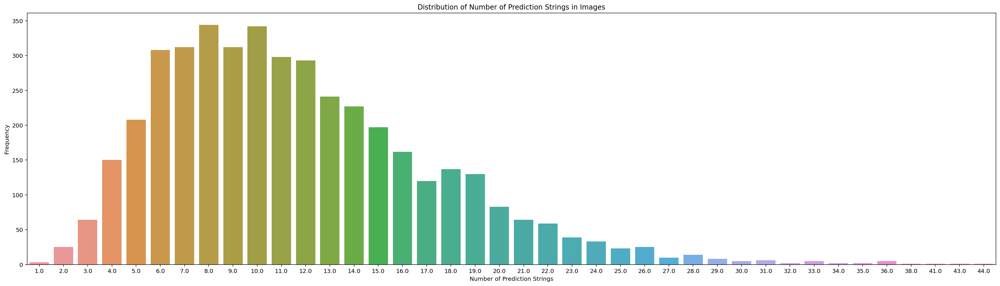

In [10]:
plt.figure(figsize=(30,8));
sns.countplot(x=train['n_car']);
plt.title('Distribution of Number of Prediction Strings in Images');
plt.xlabel('Number of Prediction Strings');
plt.ylabel('Frequency');

As we can see, most images have # of cars in the range of `5-15`. There are some extreme examples with 1 or 44 cars. Let's take a look.

In [11]:
train.sort_values('n_car', ascending=False)

,ImageId,PredictionString,n_car
2742,ID_a0460529d,60 0.143032 0.00670016 -3.07719 -3.13026 2.808...,44.0
3426,ID_240e204c5,28 0.141879 -0.0155871 -3.09094 -0.503011 4.86...,43.0
4086,ID_901fa9e6c,6 0.364348 2.10959 -3.09094 10.6951 4.26144 16...,41.0
2945,ID_1f43393d8,25 0.147448 -3.03992 -3.10147 -24.5799 6.66901...,38.0
2565,ID_fa021e056,54 0.187242 -1.38889 -3.11543 30.9001 8.9442 4...,36.0
...,...,...,...
2878,ID_d54eb039d,23 0.150839 -0.00666221 -3.08992 -3.86772 2.98...,2.0
3857,ID_c9802301e,12 0.107303 0.0297148 -3.10836 -3.15884 2.6413...,2.0
1226,ID_6dd7f07a5,28 0.13068 -0.0145137 -3.09181 -2.49094 3.9002...,1.0
2339,ID_a14da1c3e,16 0.156941 -0.0138759 -3.09393 -3.17496 2.474...,1.0


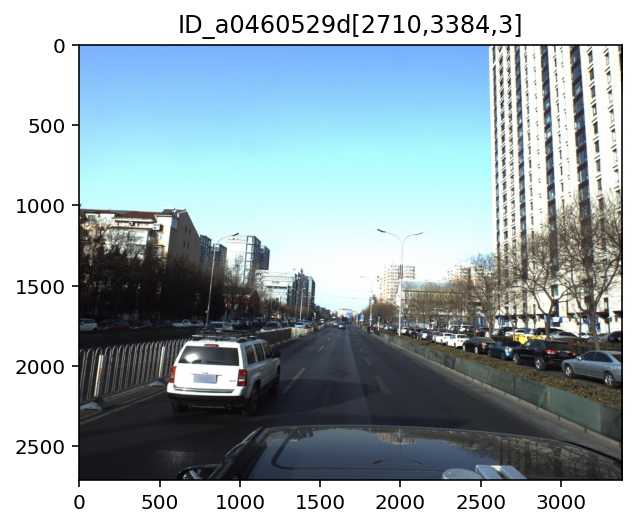

In [12]:
example_44 = read_img(image_id = 'ID_a0460529d', 
                      image_dir = 'train_images/',
                      show = True)

Indeed, there are many cars on the images.

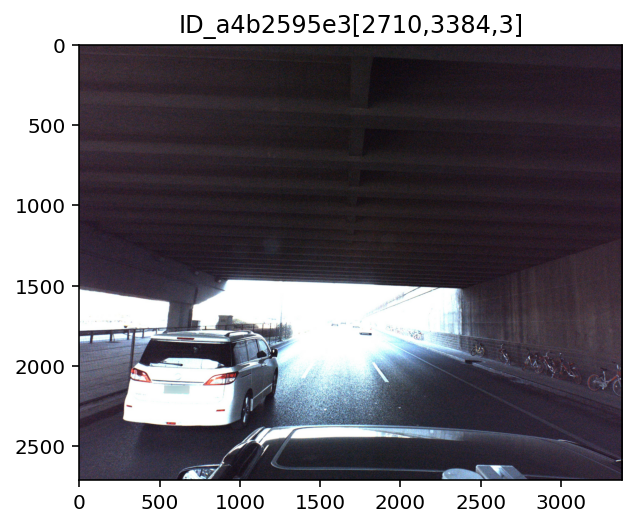

In [13]:
example_1 = read_img(image_id = 'ID_a4b2595e3', 
                     image_dir = 'train_images/',
                     show = True)

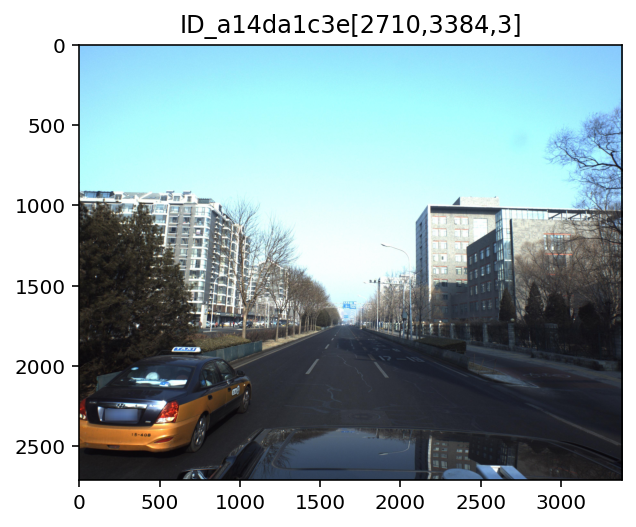

In [14]:
example_1 = read_img(image_id = 'ID_a14da1c3e', 
                     image_dir = 'train_images/',
                     show = True)

There is only 1 car on these two examples.

## Expanded data as a per-car level
As you noticed, there are multi cars in one image. Can we expand the dataframe at a per-car level?

In [15]:
expanded_df = pd.DataFrame()
for i in train.PredictionString:
    expanded_df = pd.concat([expanded_df, decode_prediction_string(i, verbose=False)], ignore_index=True)

In [16]:
print(f'There are a total of {expanded_df.shape[0]} cars in the training set.')

There are a total of 49684 cars in the training set.


Let's see what car models do we have in these cars.

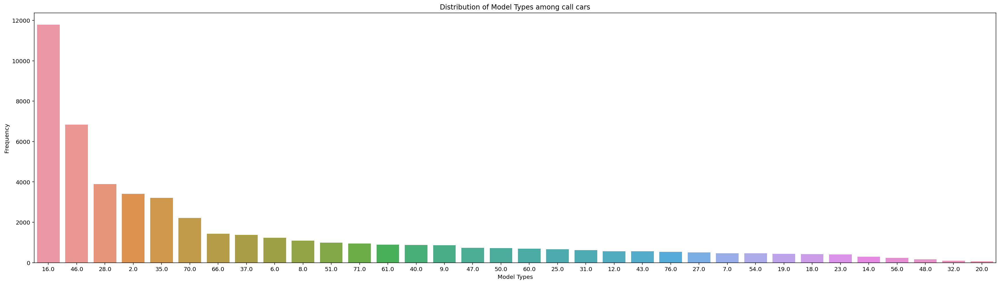

In [17]:
plt.figure(figsize=(30,8));
sns.countplot(x=expanded_df.model_type, order=expanded_df.model_type.value_counts().index);
plt.title('Distribution of Model Types among call cars');
plt.xlabel('Model Types');
plt.ylabel('Frequency');

Model type 16 is really popular. Now let's visualize `yaw, pitch, roll, x, y, z`.

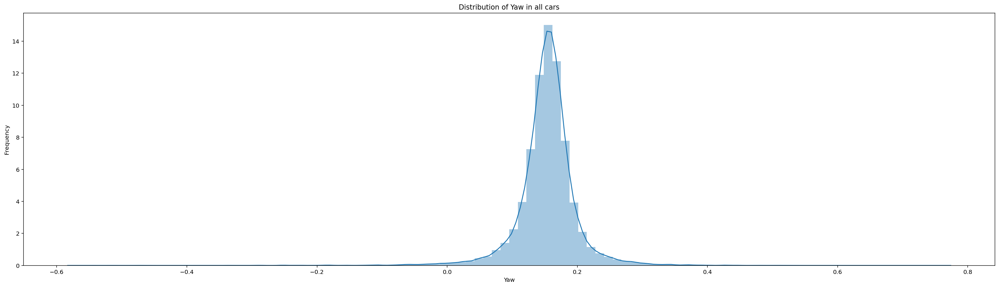

In [18]:
plt.figure(figsize=(30,8));
sns.distplot(expanded_df.yaw, bins=100);
plt.title('Distribution of Yaw in all cars');
plt.xlabel('Yaw');
plt.ylabel('Frequency');

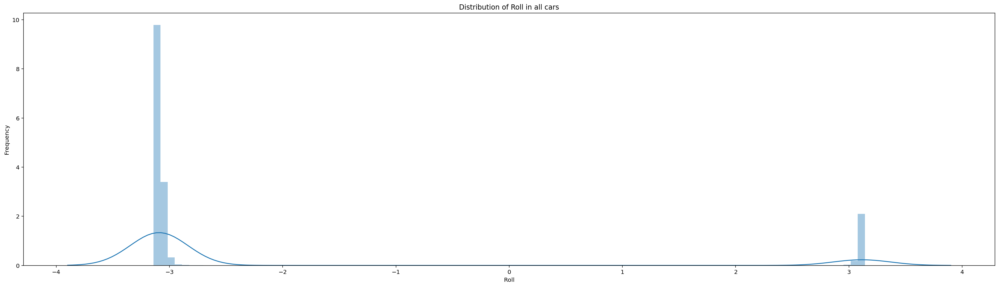

In [19]:
plt.figure(figsize=(30,8));
sns.distplot(expanded_df.roll, bins=100);
plt.title('Distribution of Roll in all cars');
plt.xlabel('Roll');
plt.ylabel('Frequency');

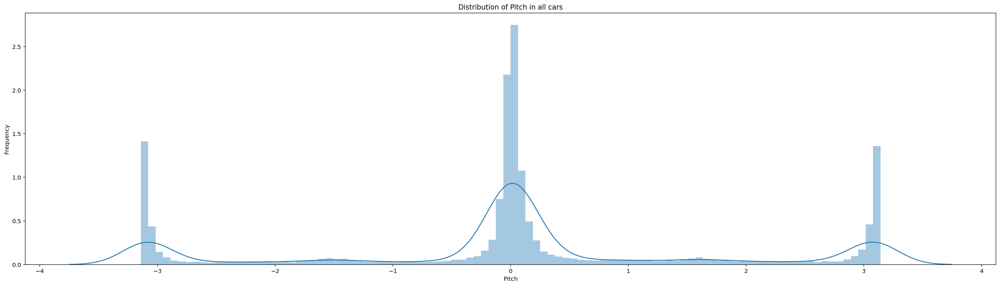

In [20]:
plt.figure(figsize=(30,8));
sns.distplot(expanded_df.pitch, bins=100);
plt.title('Distribution of Pitch in all cars');
plt.xlabel('Pitch');
plt.ylabel('Frequency');

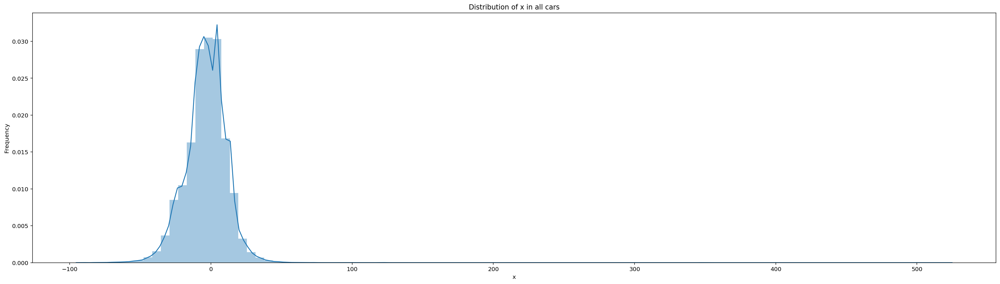

In [21]:
plt.figure(figsize=(30,8));
sns.distplot(expanded_df.x, bins=100);
plt.title('Distribution of x in all cars');
plt.xlabel('x');
plt.ylabel('Frequency');

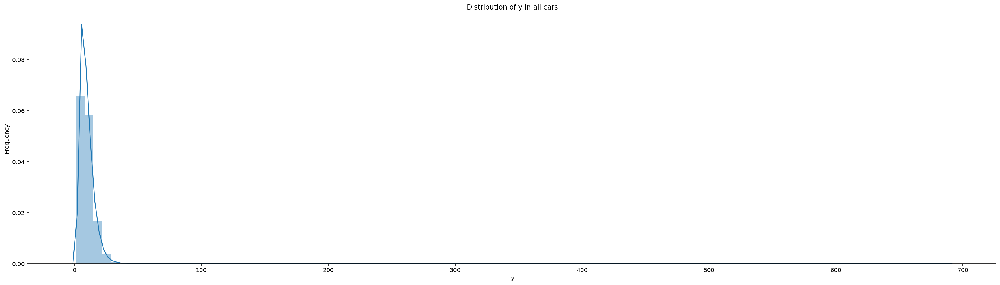

In [22]:
plt.figure(figsize=(30,8));
sns.distplot(expanded_df.y, bins=100);
plt.title('Distribution of y in all cars');
plt.xlabel('y');
plt.ylabel('Frequency');

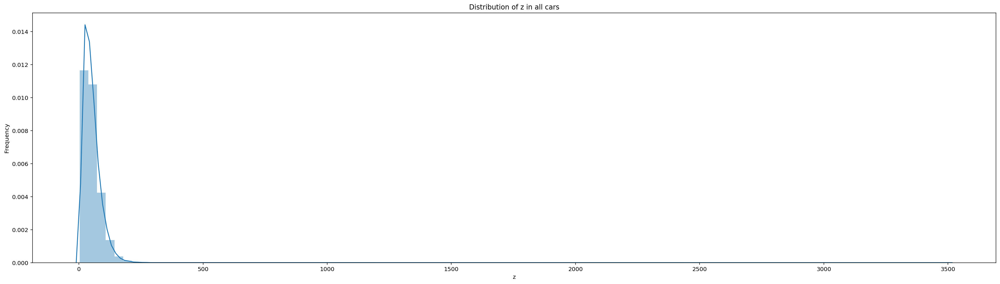

In [23]:
plt.figure(figsize=(30,8));
sns.distplot(expanded_df.z, bins=100);
plt.title('Distribution of z in all cars');
plt.xlabel('z');
plt.ylabel('Frequency');

## Understanding XYZ

Let's visualize some `x, y, z` in an actual image. We have a 2d image but we have 3 values, why?

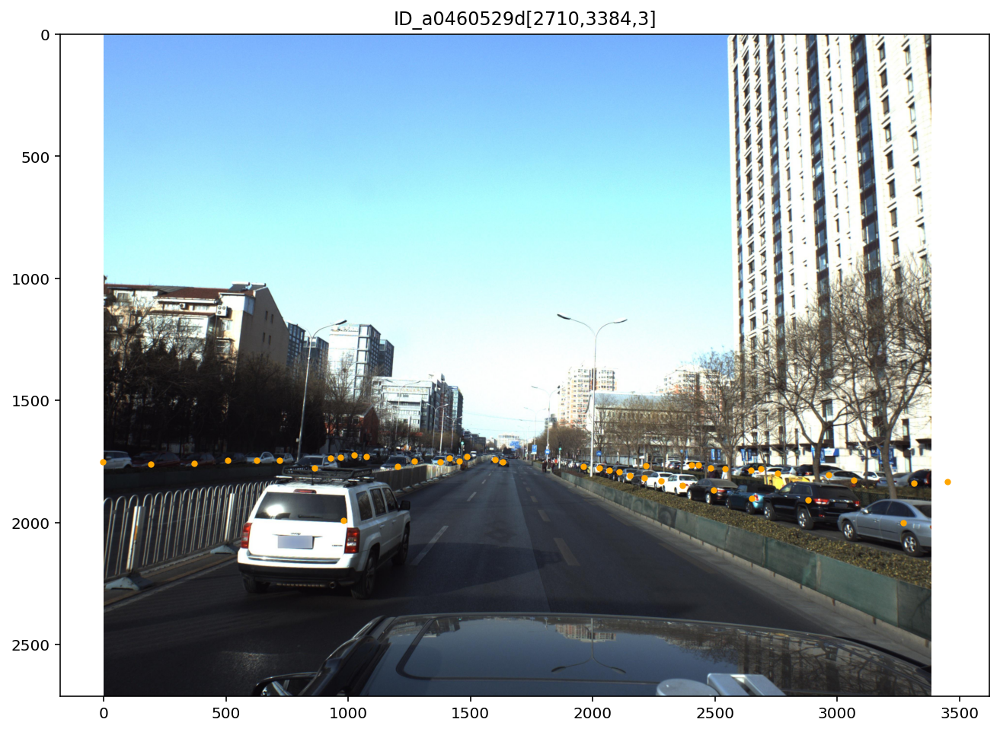

In [24]:
plt.figure(figsize=(12,8))
show_xyz_on_image(img_id='ID_a0460529d')

There are two points outside of the image.

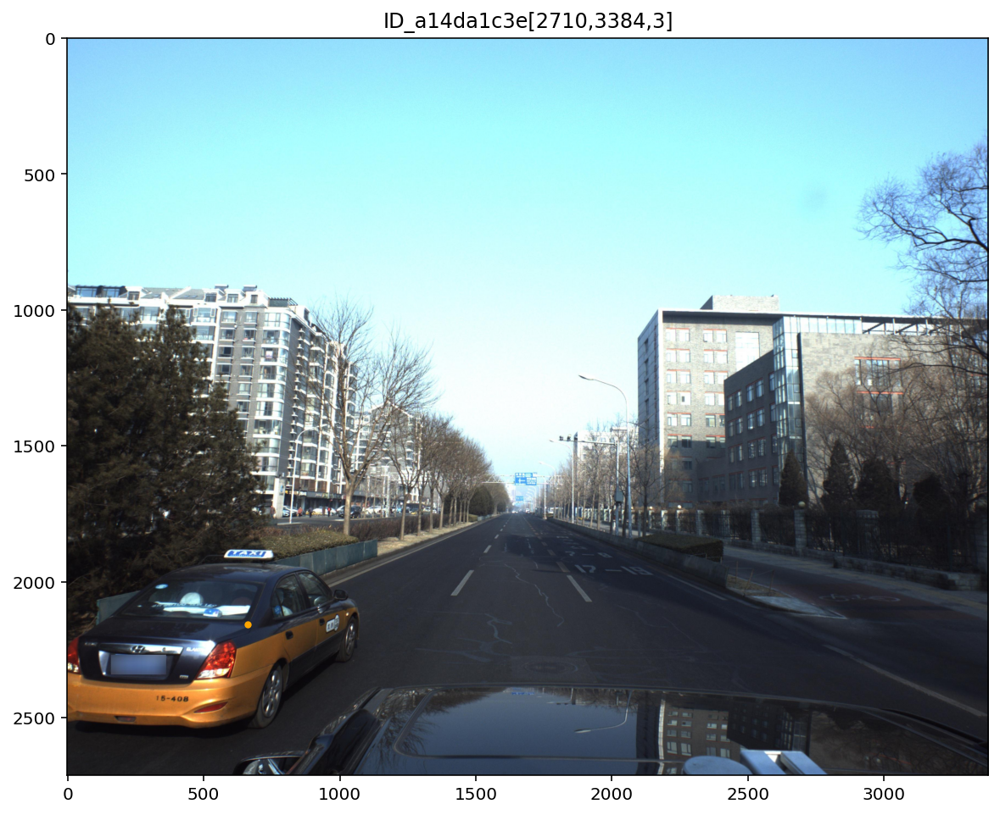

In [25]:
plt.figure(figsize=(12,8))
show_xyz_on_image(img_id='ID_a14da1c3e')

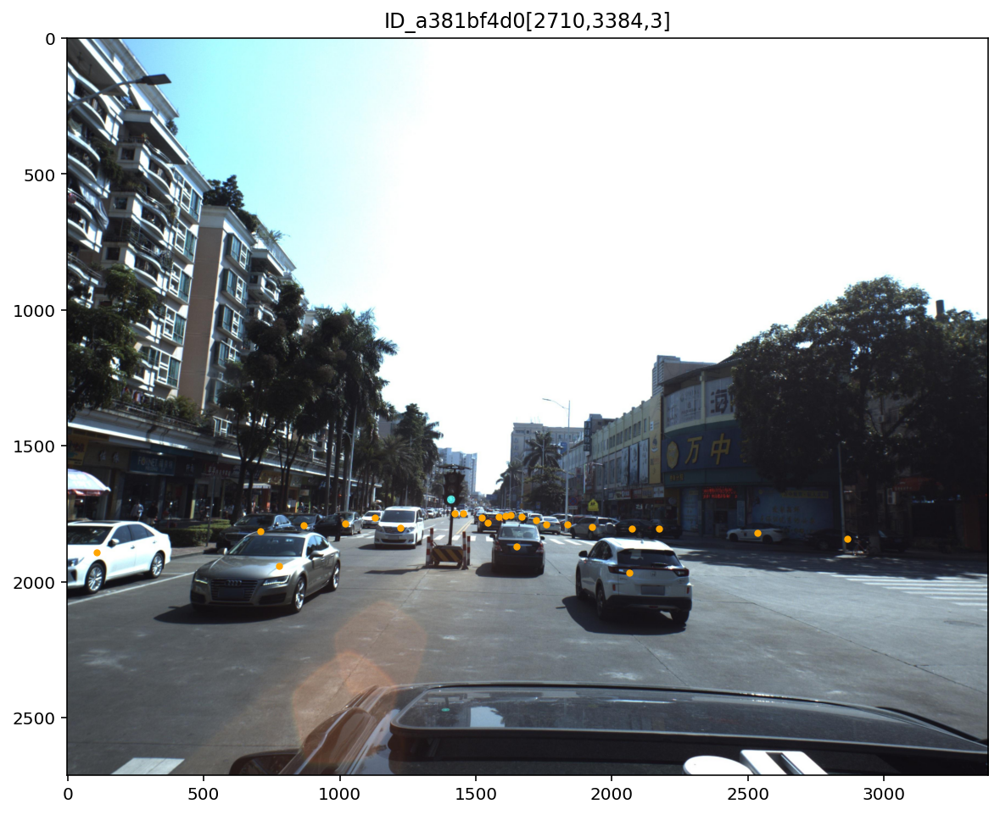

In [26]:
plt.figure(figsize=(12,8))
show_xyz_on_image(img_id='ID_a381bf4d0')

as you can see `x, y, z` in the **prediction string** can be converted to `image_x`, `image_y`, `distance from the camera` by combining with the `camera instrinsic parameters`. In the literatures, this `camera instrinsic parameters` is often denoted as `K`.

## Understanding roll pitch yaw

There are 44 cars present on this image.


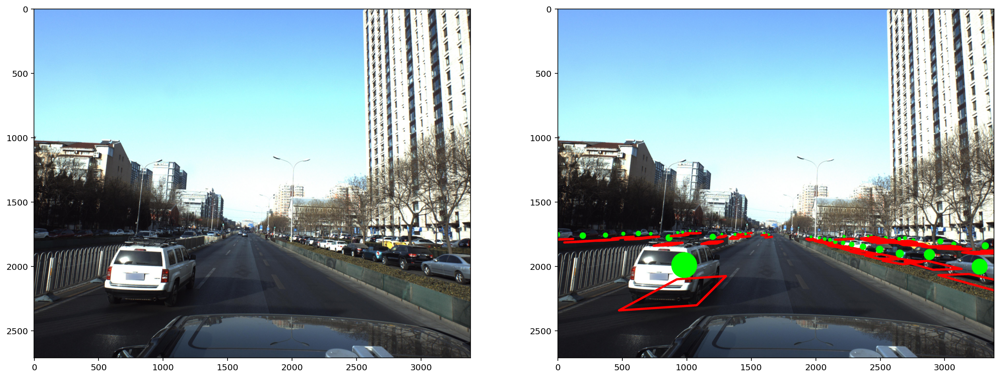

In [27]:
visualize3D_by_id('ID_a0460529d')

There are 1 cars present on this image.


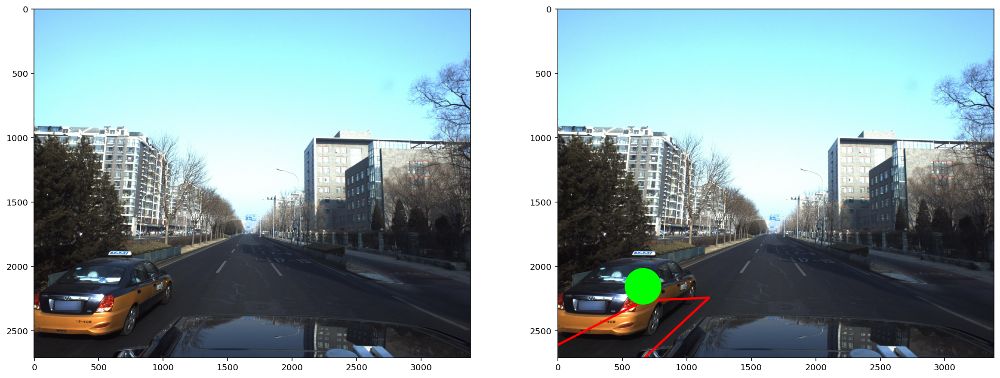

In [222]:
visualize3D_by_id('ID_a14da1c3e')

There are 25 cars present on this image.


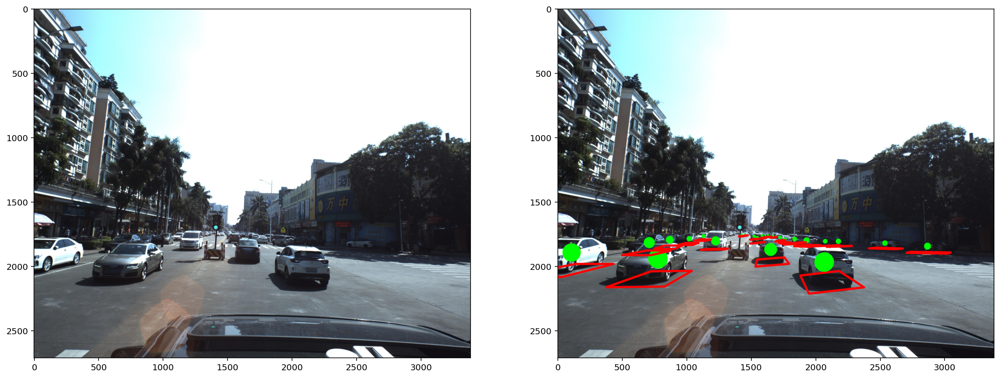

In [223]:
visualize3D_by_id('ID_a381bf4d0')